Calculate the Bayes Factor for $M_*$ to determine whether the void and wall samples are drawn from the same or different parent distributions.

In [1]:
from astropy.table import Table
from astropy.io import fits

import numpy as np

import sys

import pickle

import pocomc as pc

import matplotlib
import matplotlib.pyplot as plt

from functions import Model_1_plot, Model_2_plot

np.set_printoptions(threshold=sys.maxsize)

In [2]:
matplotlib.rc('font', size=14)
matplotlib.rc('font', family='DejaVu Sans')

# Data

In [3]:
#data_directory = '../../../../data/'
data_directory = '../../../../Data/NSA/'
data_filename = data_directory + 'NSA_v1_0_1_VAGC_vflag-V2-VF_updated.fits'

hdu = fits.open(data_filename)
data = Table(hdu[1].data)
hdu.close()

## Just keep the main SDSS DR7 footprint

In [4]:
# When the catalog is the NSA, only keep those objects which were originally in the DR7 LSS
catalog_SDSS = data[data['IN_DR7_LSS'] == 1]

ra_boolean = np.logical_and(catalog_SDSS['RA'] > 110, catalog_SDSS['RA'] < 270)
catalog_north = catalog_SDSS[ra_boolean]

strip_boolean = np.logical_and.reduce([catalog_north['RA'] > 250, 
                                       catalog_north['RA'] < 269, 
                                       catalog_north['DEC'] > 51, 
                                       catalog_north['DEC'] < 67])
catalog_main = catalog_north[~strip_boolean]

In [5]:
Mstar_NSA = np.log10(catalog_main['ELPETRO_MASS'])

/opt/anaconda/lib/python3.7/site-packages/ipykernel_launcher.py:1: RuntimeWarning: divide by zero encountered in log10
  """Entry point for launching an IPython kernel.


## Separate galaxies by their LSS classifications

### $V^2$

In [47]:
wall_v2 = catalog_main['vflag_V2'] == 0
void_v2 = catalog_main['vflag_V2'] == 1
edge_v2 = catalog_main['vflag_V2'] == 2
out_v2 = catalog_main['vflag_V2'] == 9

### VoidFinder

In [6]:
wall_vf = catalog_main['vflag_VF'] == 0
void_vf = catalog_main['vflag_VF'] == 1
edge_vf = catalog_main['vflag_VF'] == 2
out_vf = catalog_main['vflag_VF'] == 9

In [7]:
del catalog_main, catalog_north, data

# Fit the stellar mass distributions with skewnormal distributions

Both one- and two-parent models

This is a unimodal distribution

In [8]:
Mstar_bins = np.arange(7.5, 11.5, 0.1)

In [9]:
labels1_bi = ['s', 'a', r'$\mu_a$', r'$\sigma_a$', 'skew$_a$', 
                   'b', r'$\mu_b$', r'$\sigma_b$', 'skew$_b$']
labels2_bi = ['$a_1$', r'$\mu_{1a}$', r'$\sigma_{1a}$', 'skew$_{1a}$', 
              '$b_1$', r'$\mu_{1b}$', r'$\sigma_{1b}$', 'skew$_{1b}$', 
              '$a_2$', r'$\mu_{2a}$', r'$\sigma_{2a}$', 'skew$_{2a}$', 
              '$b_2$', r'$\mu_{2b}$', r'$\sigma_{2b}$', 'skew$_{2b}$']

## V$^2$

### 1-parent model

In [51]:
temp_infile = open('pocoMC_results/sampler_results_M1_Mstar_V2.pickle', 'rb')
V2_results1 = pickle.load(temp_infile)
temp_infile.close()

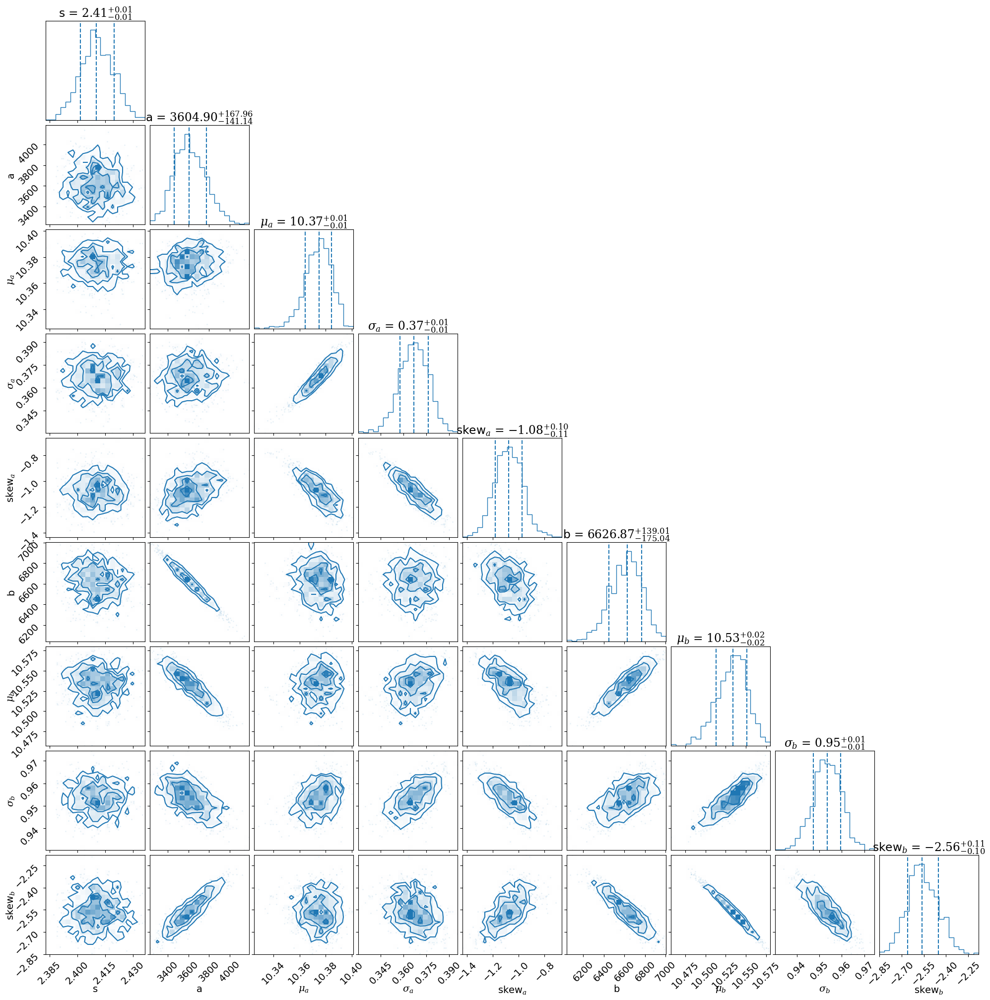

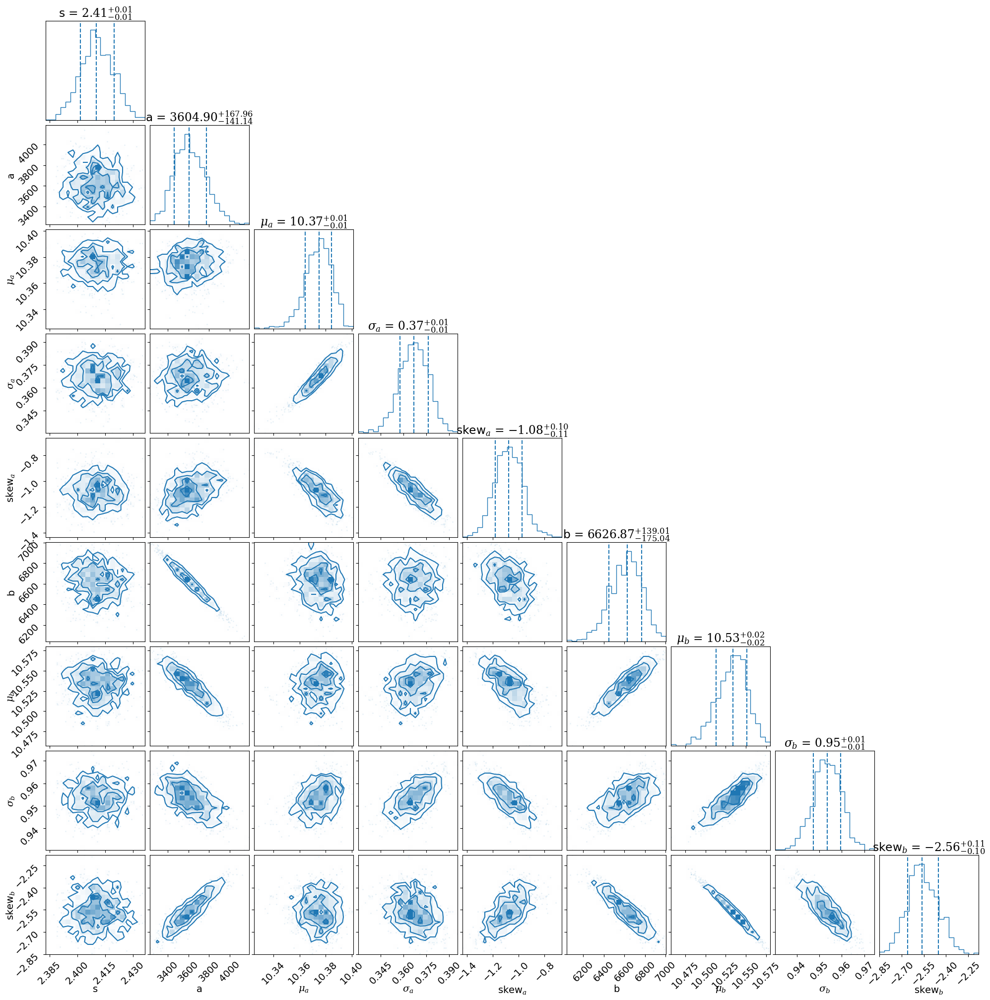

In [52]:
pc.plotting.corner(V2_results1, 
                   labels=labels1_bi, 
                   dims=range(len(labels1_bi)), 
                   show_titles=True, 
                   quantiles=[0.16, 0.5, 0.84])

In [53]:
lnzM1_V2 = V2_results1['logz'][-1]
lnzM1_V2

-976.5109832309934

In [54]:
V2_bestfit1 = np.mean(V2_results1['samples'], axis=0)

V2_bestfit1

array([ 2.4105752e+00,  3.6179065e+03,  1.0373973e+01,  3.6668268e-01,
       -1.0786840e+00,  6.6136216e+03,  1.0532433e+01,  9.5339352e-01,
       -2.5567367e+00], dtype=float32)

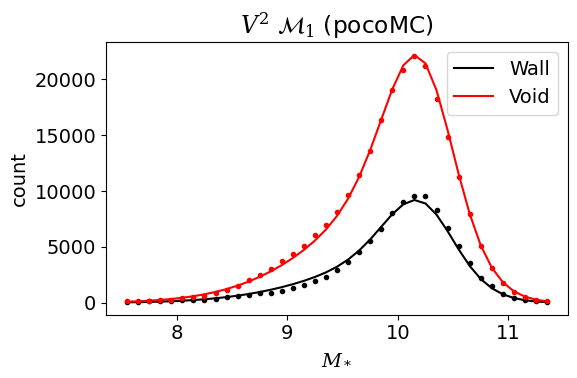

In [55]:
Model_1_plot(V2_bestfit1, 
             Mstar_NSA[wall_v2], 
             Mstar_NSA[void_v2], 
             Mstar_bins, 
             2, 
             xlabel_text='$M_*$', 
             title_text=r'$V^2$ $\mathcal{M}_1$ (pocoMC)')

### 2-parent model

In [56]:
temp_infile = open('pocoMC_results/sampler_results_M2_Mstar_V2.pickle', 'rb')
V2_results2 = pickle.load(temp_infile)
temp_infile.close()

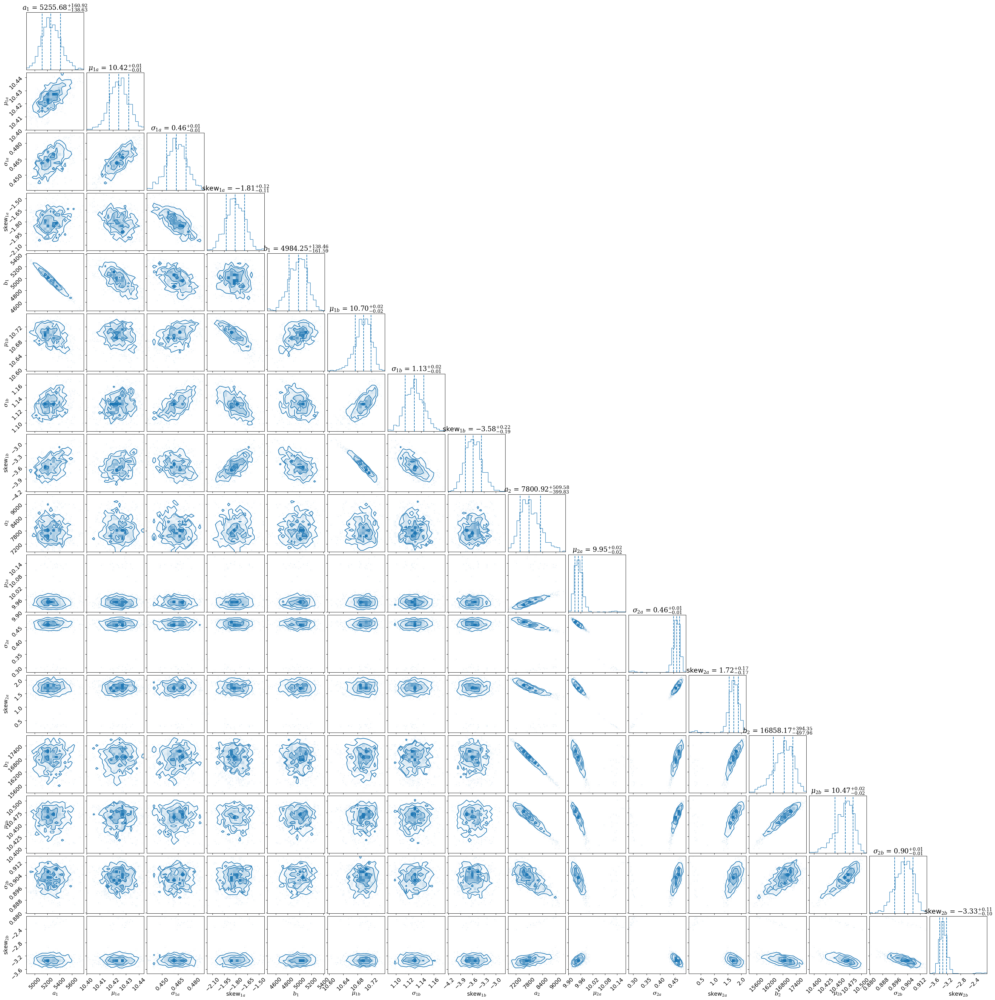

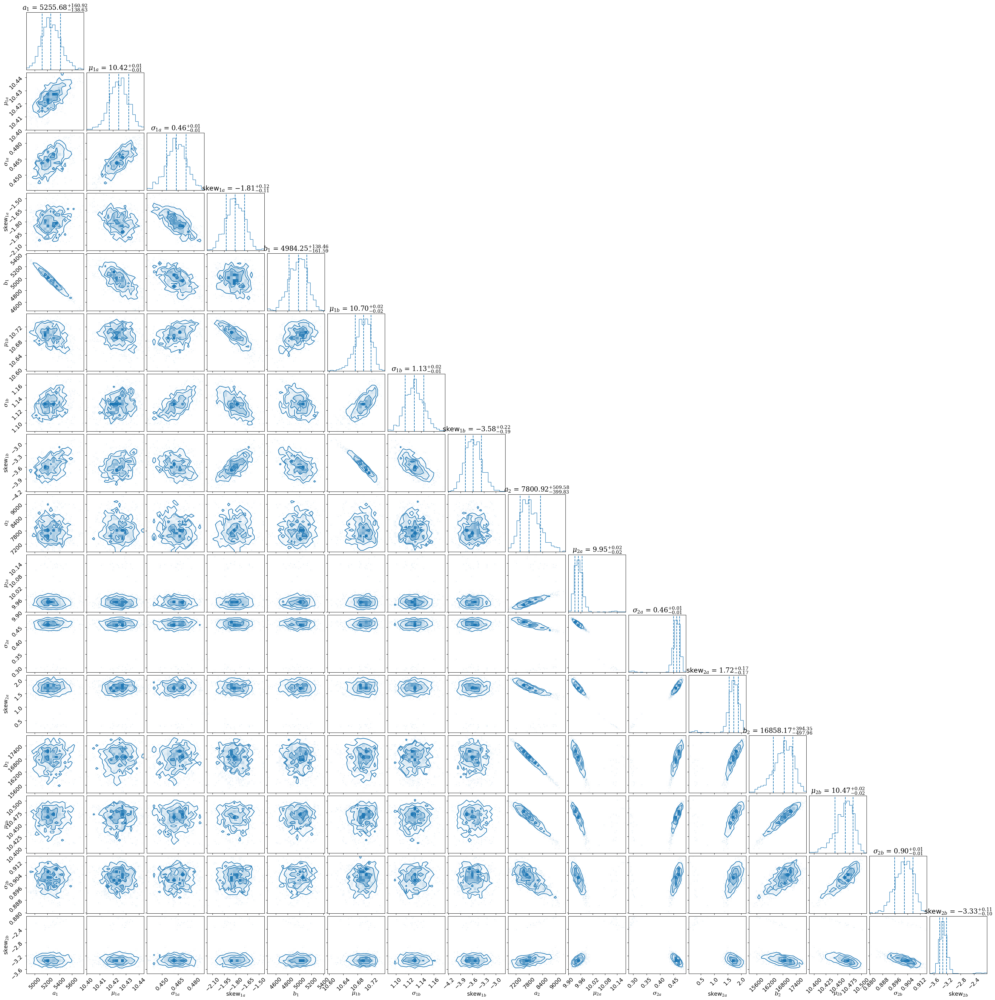

In [57]:
pc.plotting.corner(V2_results2, 
                   labels=labels2_bi, 
                   dims=range(len(labels2_bi)), 
                   show_titles=True, 
                   quantiles=[0.16, 0.5, 0.84])

In [58]:
lnzM2_V2 = V2_results2['logz'][-1]
lnzM2_V2

-511.35723046809505

In [59]:
V2_bestfit2 = np.mean(V2_results2['samples'], axis=0)

V2_bestfit2

array([ 5.2657681e+03,  1.0424495e+01,  4.6339643e-01, -1.8068222e+00,
        4.9735576e+03,  1.0695165e+01,  1.1292312e+00, -3.5650141e+00,
        7.8538086e+03,  9.9529600e+00,  4.5860907e-01,  1.6983789e+00,
        1.6806699e+04,  1.0463705e+01,  9.0161067e-01, -3.3079302e+00],
      dtype=float32)

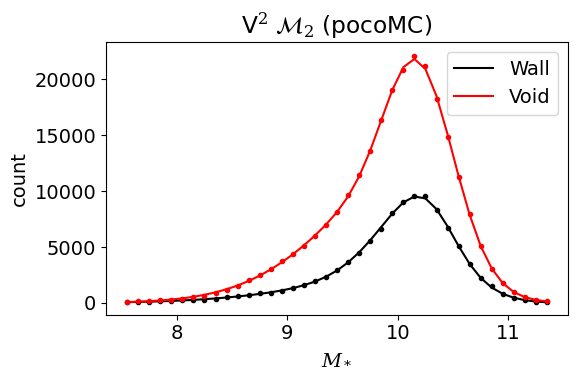

In [62]:
Model_2_plot(V2_bestfit2, 
             Mstar_NSA[wall_v2], 
             Mstar_NSA[void_v2], 
             Mstar_bins, 
             2, 
             xlabel_text='$M_*$', 
             title_text=r'V$^2$ $\mathcal{M}_2$ (pocoMC)')

### Calculate Bayes factor

In [63]:
lnB12_V2 = lnzM1_V2 - lnzM2_V2

B12_V2 = np.exp(lnB12_V2)

print('V2 Mstar: B12 = {:.3g}; log(B12) = {:.3f}'.format(B12_V2, lnB12_V2*np.log10(np.exp(1))))

V2 Mstar: B12 = 9.69e-203; log(B12) = -202.014


## VoidFinder

### 1-parent model

In [10]:
temp_infile = open('pocoMC_results/sampler_results_M1_Mstar_VoidFinder.pickle', 'rb')
VF_results1 = pickle.load(temp_infile)
temp_infile.close()

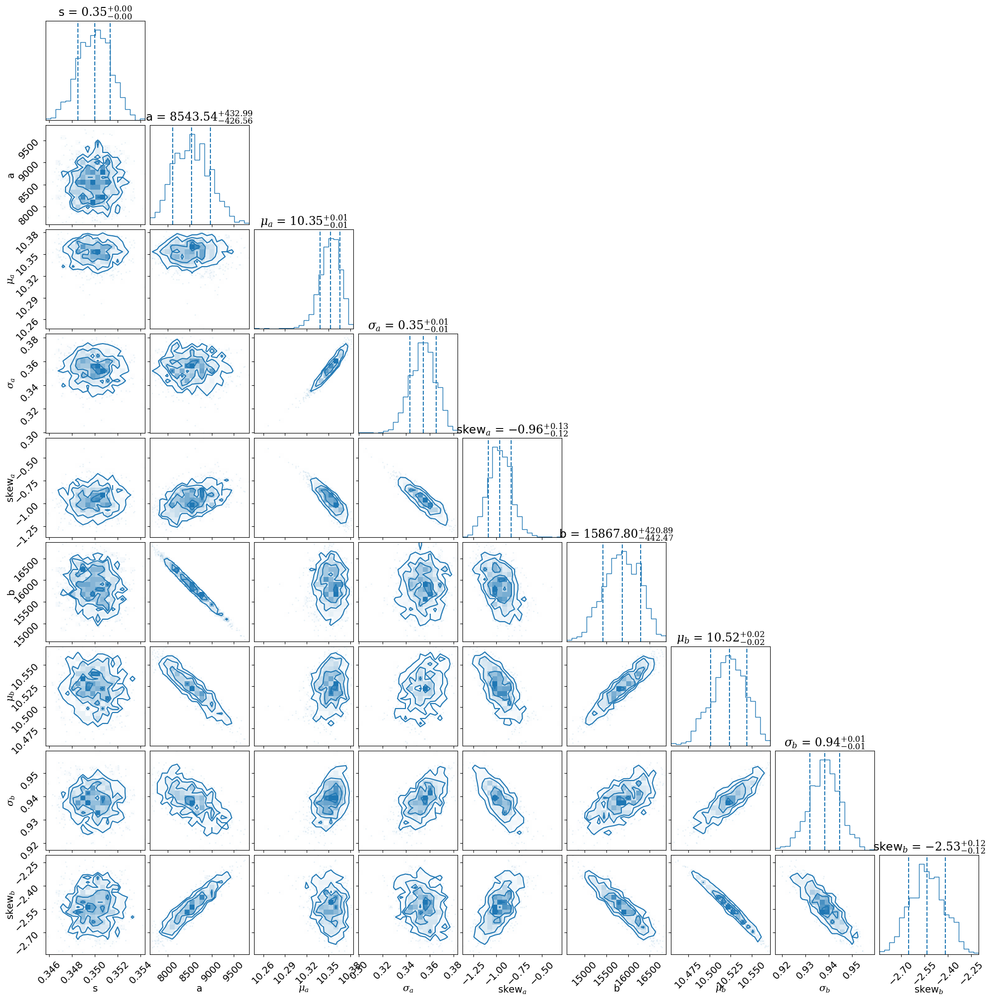

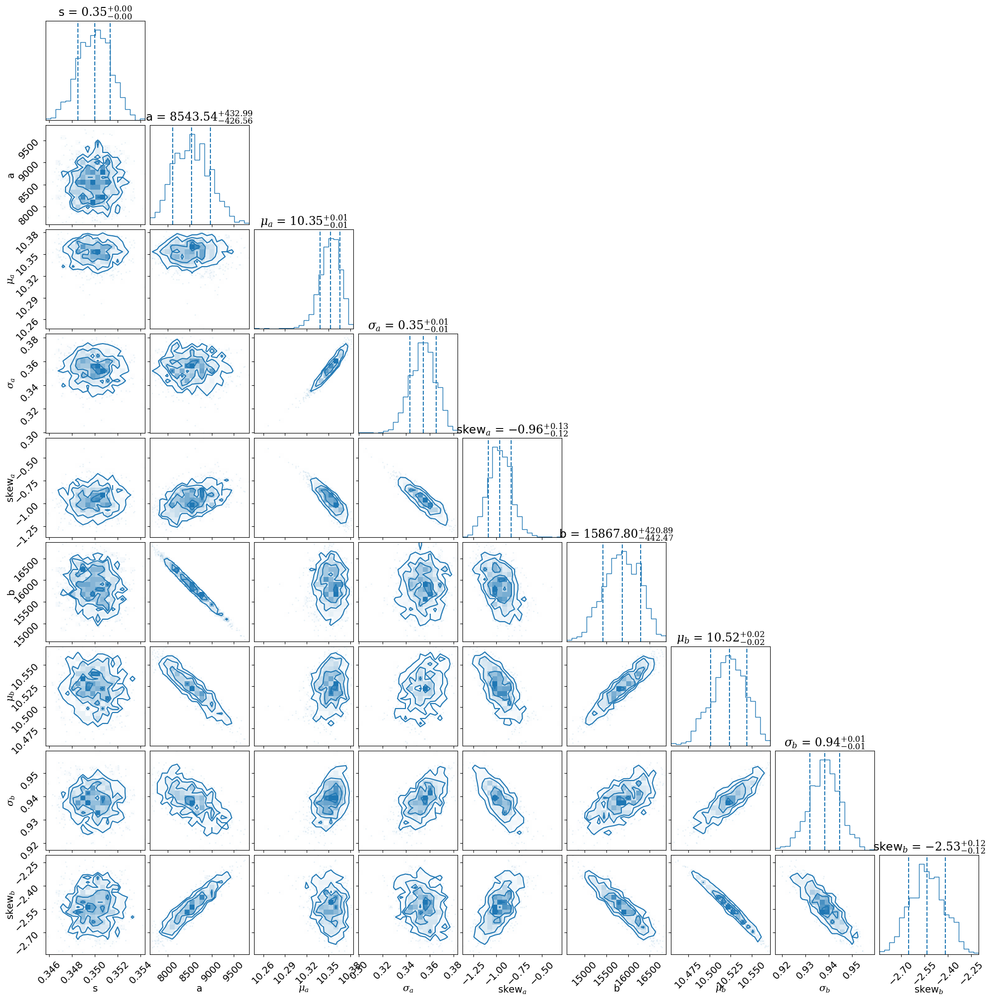

In [11]:
pc.plotting.corner(VF_results1, 
                   labels=labels1_bi, 
                   dims=range(len(labels1_bi)), 
                   show_titles=True, 
                   quantiles=[0.16, 0.5, 0.84])

In [12]:
lnzM1_VF = VF_results1['logz'][-1]
lnzM1_VF

-4430.584425551687

In [13]:
VF_bestfit1 = np.mean(VF_results1['samples'], axis=0)

VF_bestfit1

array([ 3.4994298e-01,  8.5530371e+03,  1.0351464e+01,  3.5402861e-01,
       -9.5991808e-01,  1.5855135e+04,  1.0522739e+01,  9.3813288e-01,
       -2.5319936e+00], dtype=float32)

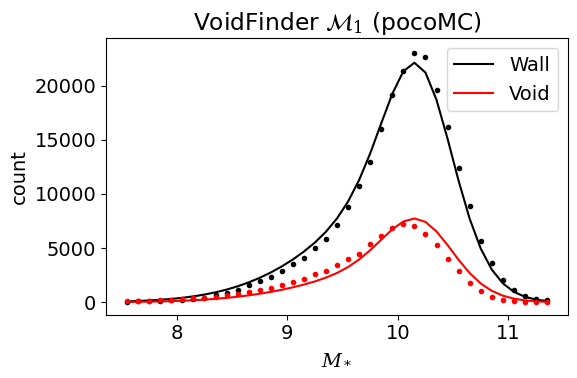

In [14]:
Model_1_plot(VF_bestfit1, 
             Mstar_NSA[wall_vf], 
             Mstar_NSA[void_vf], 
             Mstar_bins, 
             2, 
             xlabel_text='$M_*$', 
             title_text=r'VoidFinder $\mathcal{M}_1$ (pocoMC)')

### 2-parent model

In [17]:
temp_infile = open('pocoMC_results/sampler_results_M2_Mstar_VoidFinder.pickle', 'rb')
VF_results2 = pickle.load(temp_infile)
temp_infile.close()

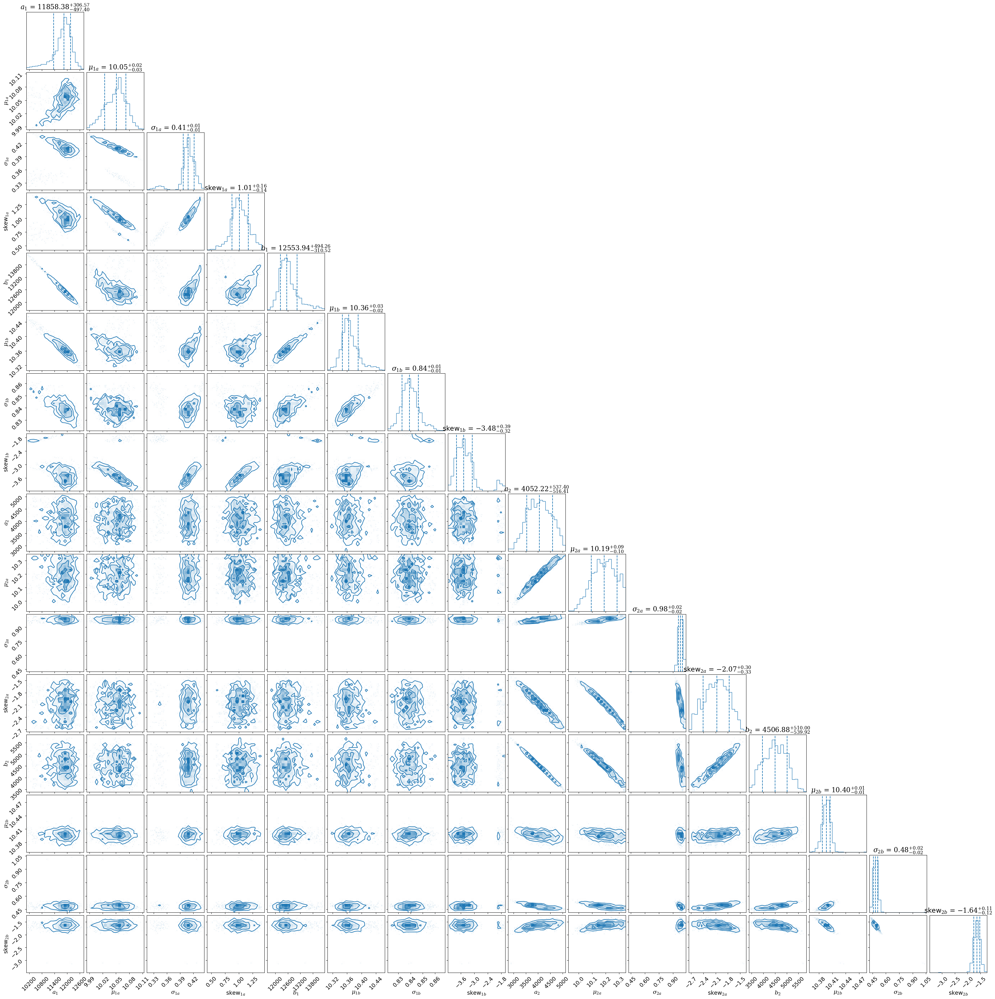

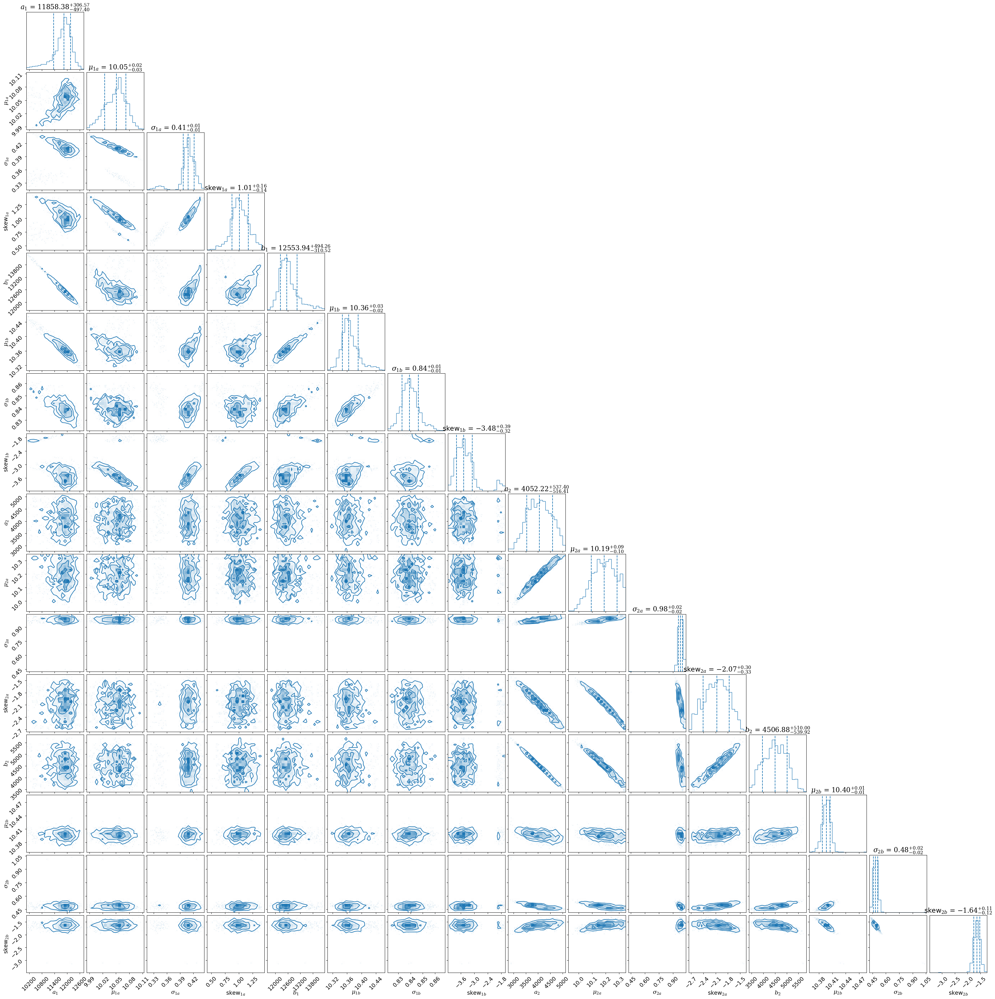

In [18]:
pc.plotting.corner(VF_results2, 
                   labels=labels2_bi, 
                   dims=range(len(labels2_bi)), 
                   show_titles=True, 
                   quantiles=[0.16, 0.5, 0.84])

In [19]:
lnzM2_VF = VF_results2['logz'][-1]
lnzM2_VF

-498.6525290965741

In [20]:
VF_bestfit2 = np.mean(VF_results2['samples'], axis=0)

VF_bestfit2

array([ 1.17590059e+04,  1.00487585e+01,  4.06108469e-01,  1.01745892e+00,
        1.26409258e+04,  1.03684893e+01,  8.39587152e-01, -3.37871289e+00,
        4.04974341e+03,  1.01873369e+01,  9.79010165e-01, -2.07926798e+00,
        4.50512793e+03,  1.03964491e+01,  4.85823452e-01, -1.64310801e+00],
      dtype=float32)

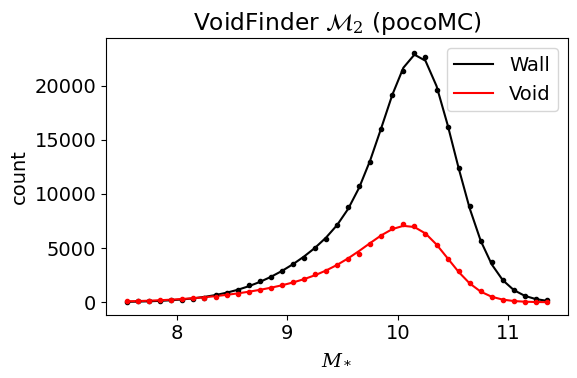

In [21]:
Model_2_plot(VF_bestfit2, 
             Mstar_NSA[wall_vf], 
             Mstar_NSA[void_vf], 
             Mstar_bins, 
             2, 
             xlabel_text='$M_*$', 
             title_text=r'VoidFinder $\mathcal{M}_2$ (pocoMC)')

### Bayes Factor

In [22]:
lnB12_VF = lnzM1_VF - lnzM2_VF

B12_VF = np.exp(lnB12_VF)

print('VoidFinder Mstar: B12 = {:.3g}; log(B12) = {:.3f}'.format(B12_VF, lnB12_VF*np.log10(np.exp(1))))

VoidFinder Mstar: B12 = 0; log(B12) = -1707.616


So both VoidFinder and V$^2$ favor $\mathcal{M}_2$, in which the two data sets come from different parent distributions, although VoidFinder favors it much more than V$^2$.